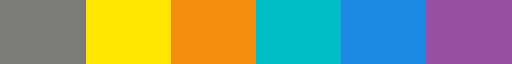

In [27]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import interp1d
import umap.umap_ as umap
import plotly.express as px
from plotly.graph_objs.layout import Scene
from plotly.graph_objs.layout.scene import XAxis, YAxis, ZAxis
import matplotlib as mpl

# Import custom functions
from scripts.functions import *

sns.set(style='white', context='notebook')
cmap = mpl.colors.ListedColormap(["#7B7B7A", "#FFE701", "#F38F0D", "#00bfc4", "#1E88E5", "#984ea3"])
state_color_map = {
    0: "#7B7B7A",
    1: "#FFE701",
    2: "#F38F0D",
    3: "#00bfc4",
    4: "#1E88E5",
    5: "#984ea3",
}
cmap

# Get Peak_aligned cycles

In [13]:
# Set path to LFP data and sleep state files
rat = '1'
condition = 'OR_N'
region = 'PFC'
path_to_data = './data/OS_basic_separated/1/study_day_5_OR_N/'
data_file = 'Cleaned_Trial1_PFC_100_CH11.continuous.mat'
states_file = 'post_trial1_states_merged.mat'
data1, sleep_scoring1 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial2_PFC_100_CH11.continuous.mat'
states_file = 'post_trial2_2017-10-03_12-00-20_1-states.mat'
data2, sleep_scoring2 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial3_PFC_100_CH11.continuous.mat'
states_file = 'post_trial3_2017-10-03_12-53-38-states.mat'
data3, sleep_scoring3 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial4_PFC_100_CH11.continuous.mat'
states_file = 'post_trial4_2017-10-03_13-45-43-states.mat'
data4, sleep_scoring4 = load_mat_data(path_to_data, data_file, states_file)

data_file = 'Cleaned_Trial5_PFC_100_CH11_3.continuous.mat'
states_file = 'post_trial5_2017-10-03_15-12-56_2-states.mat'
data5, sleep_scoring5 = load_mat_data(path_to_data, data_file, states_file)

In [15]:
# Z-scoring
data1 = (data1 - np.mean(data1)) / np.std(data1)
data2 = (data2 - np.mean(data2)) / np.std(data2)
data3 = (data3 - np.mean(data3)) / np.std(data3)
data4 = (data4 - np.mean(data4)) / np.std(data4)
data5 = (data5 - np.mean(data5)) / np.std(data5)

In [19]:
# Get Cycles
fs = 2500 # Sampling Frequency
filtered_data1 = filter_signal(data1, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='iir', butterworth_order=6, remove_edges=False)
# filtered_data1 = filter_signal(data1, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='fir', remove_edges=False)
IP1, IF1, IA1 = emd.spectra.frequency_transform(filtered_data1, fs, 'hilbert')
C = emd.cycles.Cycles(IP1)
cycles1 = get_cycles_with_metrics(C, filtered_data1, IA1, IF1)

filtered_data2 = filter_signal(data2, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='iir', butterworth_order=6, remove_edges=False)
# filtered_data2 = filter_signal(data2, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='fir', remove_edges=False)
IP2, IF2, IA2 = emd.spectra.frequency_transform(filtered_data2, fs, 'hilbert')
C = emd.cycles.Cycles(IP2)
cycles2 = get_cycles_with_metrics(C, filtered_data2, IA2, IF2)

filtered_data3 = filter_signal(data3, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='iir', butterworth_order=6, remove_edges=False)
# filtered_data3 = filter_signal(data3, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='fir', remove_edges=False)
IP3, IF3, IA3 = emd.spectra.frequency_transform(filtered_data3, fs, 'hilbert')
C = emd.cycles.Cycles(IP3)
cycles3 = get_cycles_with_metrics(C, filtered_data3, IA3, IF3)

filtered_data4 = filter_signal(data4, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='iir', butterworth_order=6, remove_edges=False)
# filtered_data4 = filter_signal(data4, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='fir', remove_edges=False)
IP4, IF4, IA4 = emd.spectra.frequency_transform(filtered_data4, fs, 'hilbert')
C = emd.cycles.Cycles(IP4)
cycles4 = get_cycles_with_metrics(C, filtered_data4, IA4, IF4)

filtered_data5 = filter_signal(data5, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='iir', butterworth_order=6, remove_edges=False)
# filtered_data5 = filter_signal(data5, fs, 'bandpass', (0.1, 4), n_cycles=3, filter_type='fir', remove_edges=False)
IP5, IF5, IA5 = emd.spectra.frequency_transform(filtered_data5, fs, 'hilbert')
C = emd.cycles.Cycles(IP5)
cycles5 = get_cycles_with_metrics(C, filtered_data5, IA5, IF5)

C:\anaconda3\Lib\site-packages\neurodsp\filt\utils.py:90: RuntimeWarning: divide by zero encountered in log10
  db = 20 * np.log10(abs(h_vals))


 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'


In [20]:
# Select only good cycles
cycles1 = get_cycles_with_conditions(cycles1, ['is_good==1'])
cycles2 = get_cycles_with_conditions(cycles2, ['is_good==1'])
cycles3 = get_cycles_with_conditions(cycles3, ['is_good==1'])
cycles4 = get_cycles_with_conditions(cycles4, ['is_good==1'])
cycles5 = get_cycles_with_conditions(cycles5, ['is_good==1'])

In [21]:
# Get metrics for cycles
metrics1 = cycles1.get_metric_dataframe(subset=True)
metrics1['Post_Trial'] = '1'
metrics1['State'] = ((metrics1['start_sample']+metrics1['stop_sample'])//2).apply(get_sleep_state, sleep_scoring=sleep_scoring1)
metrics2 = cycles2.get_metric_dataframe(subset=True)
metrics2['Post_Trial'] = '2'
metrics2['State'] = ((metrics2['start_sample']+metrics2['stop_sample'])//2).apply(get_sleep_state, sleep_scoring=sleep_scoring2)
metrics3 = cycles3.get_metric_dataframe(subset=True)
metrics3['Post_Trial'] = '3'
metrics3['State'] = ((metrics3['start_sample']+metrics3['stop_sample'])//2).apply(get_sleep_state, sleep_scoring=sleep_scoring3)
metrics4 = cycles4.get_metric_dataframe(subset=True)
metrics4['Post_Trial'] = '4'
metrics4['State'] = ((metrics4['start_sample']+metrics4['stop_sample'])//2).apply(get_sleep_state, sleep_scoring=sleep_scoring4)
metrics5 = cycles5.get_metric_dataframe(subset=True)
metrics5['Post_Trial'] = '5'
metrics5['State'] = ((metrics5['start_sample']+metrics5['stop_sample'])//2).apply(get_sleep_state, sleep_scoring=sleep_scoring5)

In [22]:
metrics1.drop(0, axis=0, inplace=True)
metrics2.drop(0, axis=0, inplace=True)
metrics3.drop(0, axis=0, inplace=True)
metrics4.drop(0, axis=0, inplace=True)
metrics5.drop(0, axis=0, inplace=True)

metrics1.drop(metrics1.shape[0], axis=0, inplace=True)
metrics2.drop(metrics2.shape[0], axis=0, inplace=True)
metrics3.drop(metrics3.shape[0], axis=0, inplace=True)
metrics4.drop(metrics4.shape[0], axis=0, inplace=True)
metrics5.drop(metrics5.shape[0], axis=0, inplace=True)

In [23]:
metrics1['Actual_peak_time'] = metrics1['start_sample'] + metrics1['peak_position']
metrics2['Actual_peak_time'] = metrics2['start_sample'] + metrics2['peak_position']
metrics3['Actual_peak_time'] = metrics3['start_sample'] + metrics3['peak_position']
metrics4['Actual_peak_time'] = metrics4['start_sample'] + metrics4['peak_position']
metrics5['Actual_peak_time'] = metrics5['start_sample'] + metrics5['peak_position']

In [33]:
# Remove really small cycles
metrics1 = metrics1[metrics1['max_amp'] >= np.percentile(metrics1['max_amp'], 25)]
metrics2 = metrics2[metrics2['max_amp'] >= np.percentile(metrics2['max_amp'], 25)]
metrics3 = metrics3[metrics3['max_amp'] >= np.percentile(metrics3['max_amp'], 25)]
metrics4 = metrics4[metrics4['max_amp'] >= np.percentile(metrics4['max_amp'], 25)]
metrics5 = metrics5[metrics5['max_amp'] >= np.percentile(metrics5['max_amp'], 25)]

In [35]:
waveforms1 = []
for i, row in metrics1.iterrows():
    peak = int(row['Actual_peak_time'])
    waveform = filtered_data1[peak-250:peak+1000]
    waveforms1.append(waveform)
waveforms1 = np.array(waveforms1)

waveforms2 = []
for i, row in metrics2.iterrows():
    peak = int(row['Actual_peak_time'])
    waveform = filtered_data2[peak-250:peak+1000]
    waveforms2.append(waveform)
waveforms2 = np.array(waveforms2)

waveforms3 = []
for i, row in metrics3.iterrows():
    peak = int(row['Actual_peak_time'])
    waveform = filtered_data3[peak-250:peak+1000]
    waveforms3.append(waveform)
waveforms3 = np.array(waveforms3)

waveforms4 = []
for i, row in metrics4.iterrows():
    peak = int(row['Actual_peak_time'])
    waveform = filtered_data4[peak-250:peak+1000]
    waveforms4.append(waveform)
waveforms4 = np.array(waveforms4)

waveforms5 = []
for i, row in metrics5.iterrows():
    peak = int(row['Actual_peak_time'])
    waveform = filtered_data5[peak-250:peak+1000]
    waveforms5.append(waveform)
waveforms5 = np.array(waveforms5)

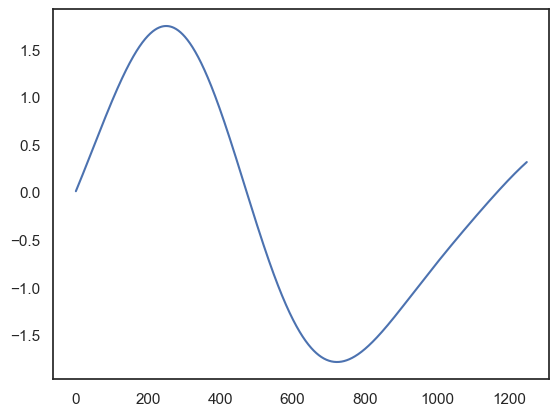

In [47]:
index = np.random.randint(0, waveforms5.shape[0])
plt.plot(waveforms5[index]);

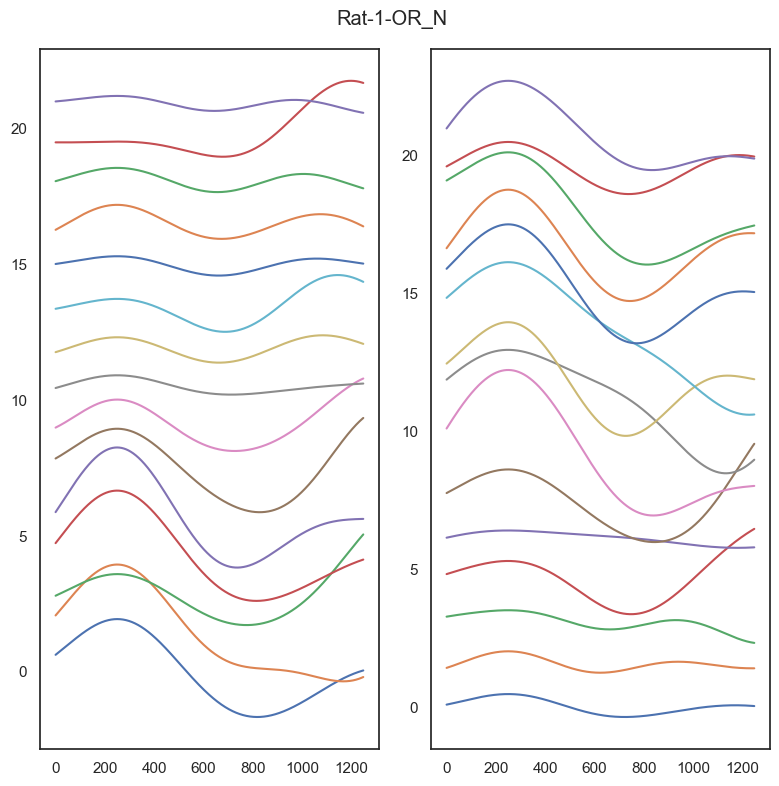

In [55]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
start = 0
for i in range(15):
  index = np.random.randint(0, waveforms5.shape[0])
  plt.plot(waveforms5[index]+start)
  start += 1.5

plt.subplot(1,2,2)
start = 0
for i in range(15):
  index = np.random.randint(0, waveforms5.shape[0])
  plt.plot(waveforms5[index]+start)
  start += 1.5
plt.suptitle(f'Rat-{rat}-{condition}')
plt.tight_layout()
# plt.savefig(f'./plots/10-02-2025/Rat-{rat}-{condition} Peak-aligned cycles.png')

In [57]:
def resampled_waveforms(waveforms):
    new_waveforms = np.zeros((128, waveforms.shape[0]))*np.nan
    for i, wave in enumerate(waveforms):
        time = np.arange(len(wave))
        time_normalized = time / (len(wave) - 1)
        t_new = np.linspace(0, 1, 128)
        func = interp1d(time_normalized, wave, kind='linear')
        v_new = func(t_new)
        new_waveforms[:, i] = v_new
    return new_waveforms.T

In [63]:
resampled_waveforms1 = resampled_waveforms(waveforms1)
resampled_waveforms2 = resampled_waveforms(waveforms2)
resampled_waveforms3 = resampled_waveforms(waveforms3)
resampled_waveforms4 = resampled_waveforms(waveforms4)
resampled_waveforms5 = resampled_waveforms(waveforms5)
del waveforms1, waveforms2, waveforms3, waveforms4, waveforms5

In [69]:
all_resampled_waveforms = pd.concat([pd.DataFrame(resampled_waveforms1),
                                pd.DataFrame(resampled_waveforms2),
                                pd.DataFrame(resampled_waveforms3),
                                pd.DataFrame(resampled_waveforms4),
                                pd.DataFrame(resampled_waveforms5)])
del resampled_waveforms1, resampled_waveforms2, resampled_waveforms3, resampled_waveforms4, resampled_waveforms5

In [71]:
all_metrics = pd.concat([metrics1, metrics2, metrics3, metrics4, metrics5])
all_metrics['cycle_time'] = (all_metrics['start_sample']+all_metrics['stop_sample'])/(2*fs)
del metrics1, metrics2, metrics3, metrics4, metrics5

In [ ]:
all_metrics

In [75]:
all_metrics = all_metrics.reset_index(drop=True)
all_resampled_waveforms = all_resampled_waveforms.reset_index(drop=True)

In [77]:
all_resampled_data = pd.concat([all_metrics, all_resampled_waveforms], axis=1)

In [79]:
all_resampled_data

,index,is_good,start_sample,stop_sample,duration,duration_samples,peak2trough,asc2desc,max_amp,trough_values,...,118,119,120,121,122,123,124,125,126,127
0,6,1,24586,25398,813,813,0.470522,0.502260,1.208209,-1.133657,...,0.944659,0.896900,0.845568,0.791058,0.733779,0.674167,0.612658,0.549701,0.485746,0.421246
1,8,1,27945,29258,1314,1314,0.397946,0.447741,0.870448,-0.870413,...,-0.551833,-0.520239,-0.487819,-0.454706,-0.421038,-0.386955,-0.352602,-0.318126,-0.283675,-0.249398
2,9,1,29259,30293,1035,1035,0.258247,0.490199,1.133023,-1.030497,...,0.022538,0.044492,0.064372,0.082122,0.097693,0.111060,0.122209,0.131141,0.137872,0.142434
3,16,1,35555,37317,1763,1763,0.499176,0.520563,1.062570,-0.676449,...,-0.628840,-0.612530,-0.593722,-0.572431,-0.548688,-0.522555,-0.494110,-0.463450,-0.430690,-0.395964
4,17,1,37318,38185,868,868,0.613281,0.447483,1.060369,-0.358642,...,1.316168,1.323455,1.326236,1.324496,1.318237,1.307504,1.292361,1.272895,1.249221,1.221475
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18670,21211,1,25460339,25461671,1333,1333,0.373706,0.629907,0.425018,-0.240205,...,-0.114034,-0.109599,-0.104913,-0.099971,-0.094769,-0.089308,-0.083592,-0.077628,-0.071428,-0.065003
18671,21216,1,25469776,25471037,1262,1262,0.701189,0.586917,0.506040,-0.146362,...,0.261974,0.266458,0.269890,0.272259,0.273561,0.273802,0.272994,0.271155,0.268310,0.264491
18672,21223,1,25484572,25485583,1012,1012,0.620801,0.543549,0.579225,-0.242454,...,-0.065163,-0.084998,-0.105226,-0.125668,-0.146139,-0.166453,-0.186423,-0.205864,-0.224591,-0.242426
18673,21224,1,25485584,25486206,623,623,0.337567,0.478508,0.403221,-0.338475,...,0.015059,-0.001787,-0.017952,-0.033354,-0.047920,-0.061593,-0.074322,-0.086070,-0.096810,-0.106527


In [81]:
all_resampled_data.to_hdf(f'./cycles_data/{region}_peak_aligned_cycles_data.h5', key=f'Rat_{rat}_{condition}', mode='a', format='table')

# UMAP

In [8]:
rat = '1'
condition = 'OR_N'
region = 'PFC'

In [9]:
Rat_data = pd.read_hdf('PFC_peak_aligned_cycles_data.h5', f'Rat_{rat}_{condition}')
# Rat_data = Rat_data[Rat_data['max_amp'] >= np.percentile(Rat_data['max_amp'], 25)]
metrics = Rat_data.iloc[:, :-128]
waveforms = np.array(Rat_data.iloc[:, -128:])

In [10]:
metrics['section'] = metrics['start_sample'].apply(get_section)

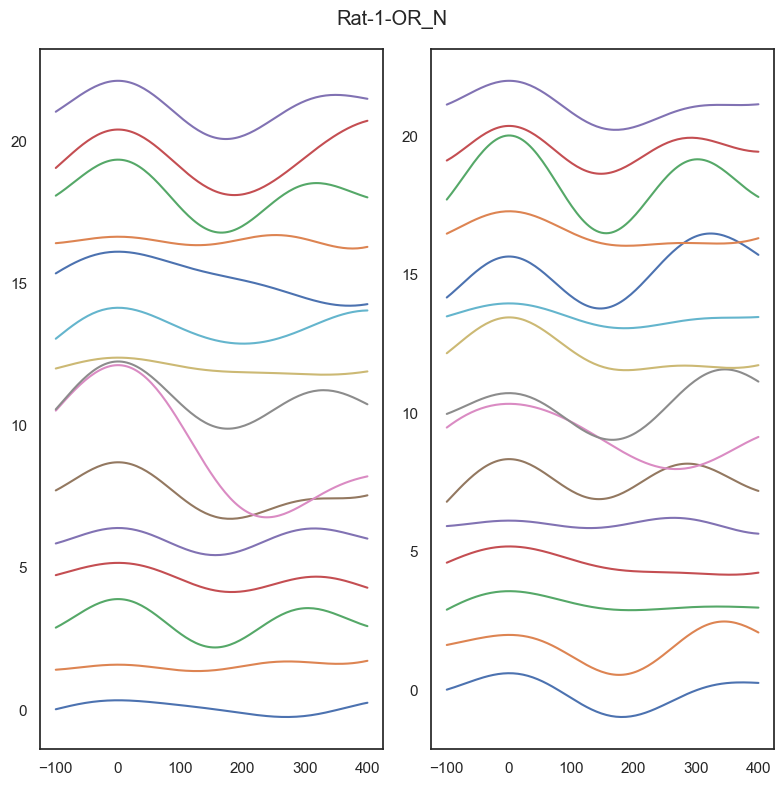

In [11]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
start = 0
for i in range(15):
  index = np.random.randint(0, waveforms.shape[0])
  plt.plot(np.linspace(-100,400,128), waveforms[index]+start)
  start += 1.5

plt.subplot(1,2,2)
start = 0
for i in range(15):
  index = np.random.randint(0, waveforms.shape[0])
  plt.plot(np.linspace(-100,400,128), waveforms[index]+start)
  start += 1.5
plt.suptitle(f'Rat-{rat}-{condition}')
plt.tight_layout()
# plt.savefig(f'./plots/10-02-2025/Rat-{rat}-{condition} Peak-aligned cycles.png')

In [17]:
ID = np.round(np.nanmean(abids(waveforms, 50)))
ID

4.0

In [18]:
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, metric='euclidean', random_state=42)
embedding = umap_embedder.fit(waveforms)
emb = embedding.embedding_

C:\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
C:\anaconda3\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


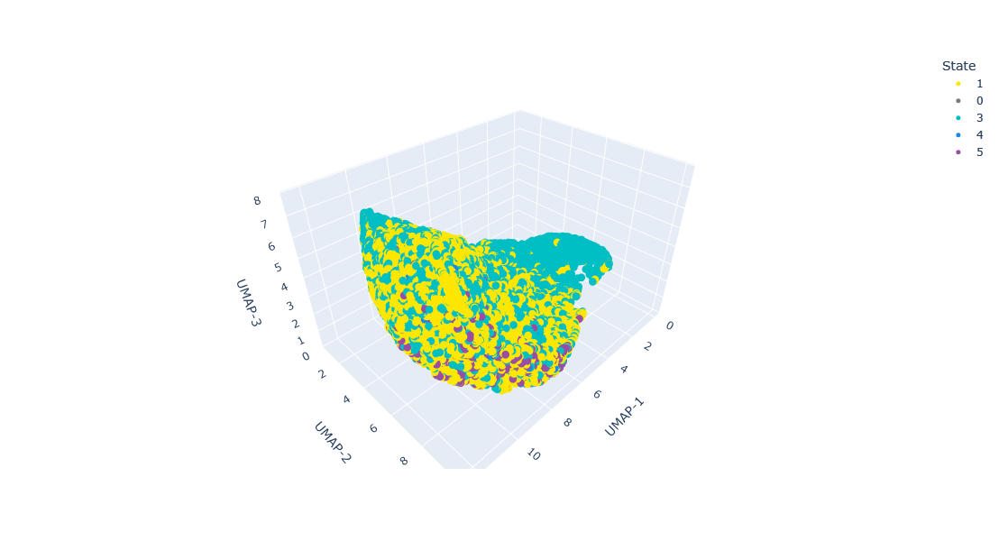

In [19]:
# 3D plot of sleep states projected on UMAP
data = metrics
feature = 'State'
data['section'] = pd.Categorical(data.section)
data['Post_Trial'] = pd.Categorical(data.Post_Trial)
# ['duration_samples', 'peak2trough', 'asc2desc', 'max_amp','trough_values', 'peak_values', 'mean_if', 'max_if', 'range_if', 'State']
fig = px.scatter_3d(x=emb[:,0], y=emb[:,1], z=emb[:,2],
              color=data[feature], color_discrete_map=state_color_map)
fig.update_layout(autosize=False,
                 width=800,
                 height=600,
                 scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')),
                      coloraxis_colorbar_title=feature,                      
                  # coloraxis=dict(
                  #           cmin=np.percentile(data[feature], 1),  # Minimum value for the color scale (you can also use the 5th percentile if preferred)
                  #           cmax=np.percentile(data[feature], 99)  # Maximum value for the color scale (95th percentile)
                  #     ),
                 legend_title_text="State",
)
fig.update_traces(marker=dict(size=5))
fig.show()
# fig.write_html(f"./plots/10-02-2025/UMAP/Rat_{rat}_ORN_PFC_embedding_state.html")
# fig.write_image("Rat6_ORN_PFC_3D_embedding.png", engine="kaleido")

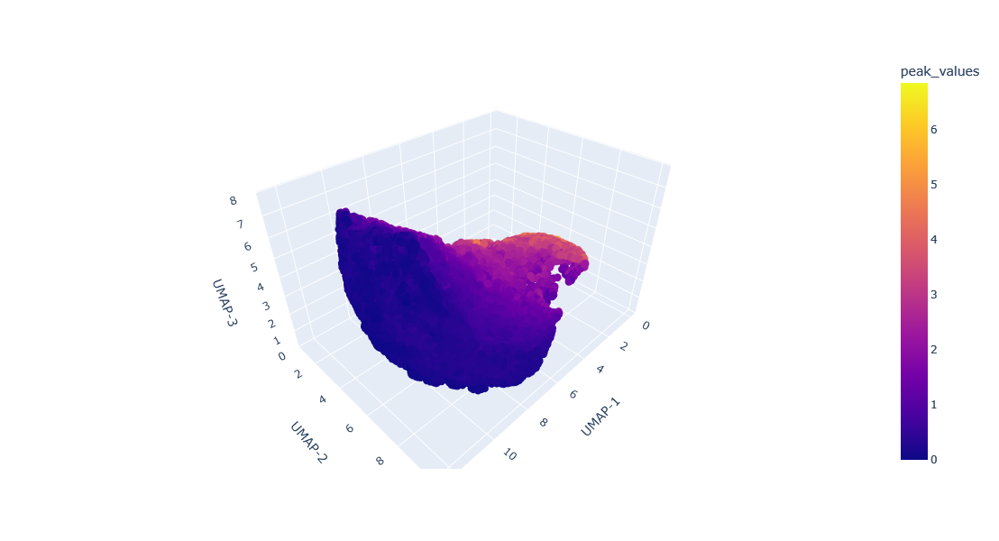

In [20]:
# 3D plot of sleep states projected on UMAP
data = metrics
feature = 'peak_values'
data['section'] = pd.Categorical(data.section)
data['Post_Trial'] = pd.Categorical(data.Post_Trial)
# ['duration_samples', 'peak2trough', 'asc2desc', 'max_amp','trough_values', 'peak_values', 'mean_if', 'max_if', 'range_if', 'State']
fig = px.scatter_3d(x=emb[:,0], y=emb[:,1], z=emb[:,2],
              color=data[feature], color_discrete_map=state_color_map)
fig.update_layout(autosize=False,
                 width=800,
                 height=600,
                 scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')),
                      coloraxis_colorbar_title=feature,                      
                  # coloraxis=dict(
                  #           cmin=np.percentile(data[feature], 1),  # Minimum value for the color scale (you can also use the 5th percentile if preferred)
                  #           cmax=np.percentile(data[feature], 99)  # Maximum value for the color scale (95th percentile)
                  #     ),
                 legend_title_text="State",
)
fig.update_traces(marker=dict(size=5))
fig.show()
# fig.write_html(f"./plots/10-02-2025/UMAP/Rat_{rat}_ORN_PFC_embedding_state.html")
# fig.write_image("Rat6_ORN_PFC_3D_embedding.png", engine="kaleido")

In [79]:
# 3D plots of features projected on UMAP
features = ['duration_samples', 'peak2trough', 'asc2desc', 'max_amp','trough_values', 'peak_values', 'mean_if', 'max_if', 'range_if']
data = metrics

for feature in features:
    fig = px.scatter_3d(x=emb[:,0], y=emb[:,1], z=emb[:,2],
                  color=data[feature])
    fig.update_layout(autosize=False,
                      width=800,
                      height=600,
                      scene=Scene(xaxis=XAxis(title='UMAP-1'),
                                yaxis=YAxis(title='UMAP-2'),
                                zaxis=ZAxis(title='UMAP-3')),
                      coloraxis_colorbar_title=feature,
                      coloraxis=dict(
                            cmin=np.percentile(data[feature], 0.5),  # Minimum value for the color scale (you can also use the 5th percentile if preferred)
                            cmax=np.percentile(data[feature], 99.5)  # Maximum value for the color scale (95th percentile)
                      )
    )
    # fig.write_html(f"./plots/10-02-2025/UMAP/Rat_{rat}_ORN_HPC_embedding_{feature}.html")

In [37]:
output_dir = "movie_frames"
os.makedirs(output_dir, exist_ok=True)
num_frames = 180
for i in range(num_frames):
    angle = i * (360 / num_frames)

    camera = dict(
        eye=dict(x=np.cos(np.radians(angle)), y=np.sin(np.radians(angle)), z=1.5)
    )

    fig.update_layout(scene_camera=camera)

    # Save each frame as a PNG
    frame_path = os.path.join(output_dir, f"frame_{i:03d}.png")
    fig.write_image(frame_path)

In [39]:
# Script to create movie from sets of images
import cv2
import os

image_folder = 'movie_frames'
video_name = 'umap_video.avi'

images = [img for img in os.listdir(image_folder) if img.endswith(".png")]
frame = cv2.imread(os.path.join(image_folder, images[0]))
height, width, layers = frame.shape

video = cv2.VideoWriter(video_name, 0, 25, (width,height))

for image in images:
    video.write(cv2.imread(os.path.join(image_folder, image)))

cv2.destroyAllWindows()
video.release()